In [1]:
#Key libraries being imported
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn as sc
import random

from ipywidgets import interact_manual
import plotly.express as px

from scipy.stats import zscore

from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, ConfusionMatrixDisplay
from sklearn.model_selection import RandomizedSearchCV, train_test_split
from scipy.stats import randint

from sklearn.tree import export_graphviz
from IPython.display import Image
import graphviz

from sklearn.preprocessing import OrdinalEncoder
ord_enc = OrdinalEncoder()

from sklearn.preprocessing import StandardScaler
from sklearn.datasets import load_iris
from sklearn import preprocessing

In [2]:
#Saving the data as a datafram from Pandas library
df = pd.read_csv('/content/drive/MyDrive/stroke_data.csv')
#tr = df.sample(frac=1)
#tr.head()

In [3]:
df.head()

,sex,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
0,1.0,63.0,0,1,1,4,1,228.69,36.6,1,1
1,1.0,42.0,0,1,1,4,0,105.92,32.5,0,1
2,0.0,61.0,0,0,1,4,1,171.23,34.4,1,1
3,1.0,41.0,1,0,1,3,0,174.12,24.0,0,1
4,1.0,85.0,0,0,1,4,1,186.21,29.0,1,1


I can use training and testing data by randomly shuffling the entire data set and using x rows for traning and 40,000 - x rows for testing.

https://datagy.io/pandas-shuffle-dataframe/

In [4]:
print(df.shape)
#print(tr.shape)

(40910, 11)


In [5]:
#Dropping any rows which have null values for any parameter
df = df.dropna()
df.head()

,sex,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
0,1.0,63.0,0,1,1,4,1,228.69,36.6,1,1
1,1.0,42.0,0,1,1,4,0,105.92,32.5,0,1
2,0.0,61.0,0,0,1,4,1,171.23,34.4,1,1
3,1.0,41.0,1,0,1,3,0,174.12,24.0,0,1
4,1.0,85.0,0,0,1,4,1,186.21,29.0,1,1


In [6]:
print(df.shape)

(40907, 11)


In [7]:
tf = pd.read_csv('/content/drive/MyDrive/stroke_data.csv')
tf.drop('stroke',inplace=True, axis=1)

In [8]:
df.describe()

,sex,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
count,40907.000000,40907.000000,40907.000000,40907.000000,40907.000000,40907.000000,40907.000000,40907.000000,40907.000000,40907.000000,40907.000000
mean,0.555162,51.327303,0.213851,0.127729,0.821326,3.461095,0.514851,122.079679,30.406488,0.488572,0.500159
std,0.496954,21.624171,0.410028,0.333792,0.383083,0.780934,0.499786,57.561951,6.835305,0.499875,0.500006
min,0.000000,-9.000000,0.000000,0.000000,0.000000,0.000000,0.000000,55.120000,11.500000,0.000000,0.000000
25%,0.000000,35.000000,0.000000,0.000000,1.000000,3.000000,0.000000,78.750000,25.900000,0.000000,0.000000
50%,1.000000,52.000000,0.000000,0.000000,1.000000,4.000000,1.000000,97.920000,29.400000,0.000000,1.000000
75%,1.000000,68.000000,0.000000,0.000000,1.000000,4.000000,1.000000,167.590000,34.100000,1.000000,1.000000
max,1.000000,103.000000,1.000000,1.000000,1.000000,4.000000,1.000000,271.740000,92.000000,1.000000,1.000000


Text(0.5, 1.0, 'BMI Box Plot')

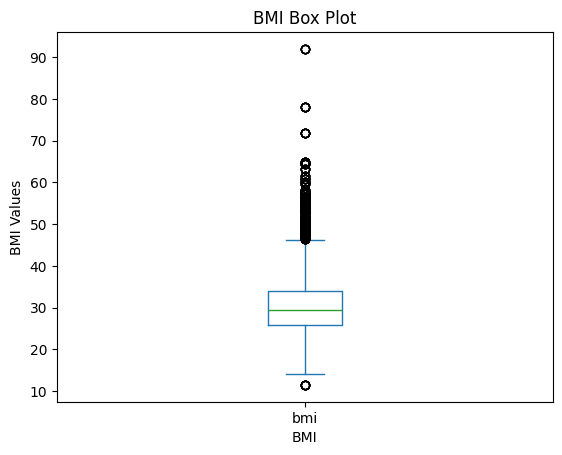

In [9]:
#Example of a box plot for one quantitative parameter
df["bmi"].plot(kind = "box")
plt.ylabel("BMI Values")
plt.xlabel("BMI")
plt.title("BMI Box Plot")

In [10]:
#Removing outliers of BMI from the data set to ensure proper distribution of data
Q1 = df['bmi'].quantile(0.25)
Q3 = df['bmi'].quantile(0.75)
IQR = Q3 - Q1
lower = Q1 - 1.5*IQR
upper = Q3 + 1.5*IQR

# Create arrays of Boolean values indicating the outlier rows
upper_array = np.where(df['bmi']>=upper)[0]
lower_array = np.where(df['bmi']<=lower)[0]

# Removing the outliers
df.drop(index=upper_array, inplace=True)
df.drop(index=lower_array, inplace=True)

In [11]:
#Removing outliers of avg glucose levels from the data set to ensure proper distribution of data
Q1 = df['avg_glucose_level'].quantile(0.25)
Q3 = df['avg_glucose_level'].quantile(0.75)
IQR = Q3 - Q1
lower = Q1 - 1.5*IQR
upper = Q3 + 1.5*IQR

# Create arrays of Boolean values indicating the outlier rows
upper_array = np.where(df['avg_glucose_level']>=upper)[0]
lower_array = np.where(df['avg_glucose_level']<=lower)[0]

# Removing the outliers
df.drop(index=upper_array, inplace=True)
df.drop(index=lower_array, inplace=True)

In [12]:
#Removing outliers of age from the data set to ensure proper distribution of data
Q1 = df['age'].quantile(0.25)
Q3 = df['age'].quantile(0.75)
IQR = Q3 - Q1
lower = Q1 - 1.5*IQR
upper = Q3 + 1.5*IQR

# Create arrays of Boolean values indicating the outlier rows
upper_array = np.where(df['age']>=upper)[0]
lower_array = np.where(df['age']<=lower)[0]

# Removing the outliers
df.drop(index=upper_array, inplace=True)
df.drop(index=lower_array, inplace=True)

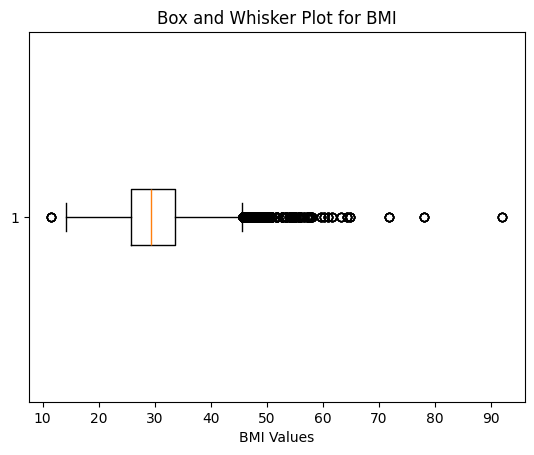

In [13]:
bmi_values = df['bmi'].tolist()

# Create a horizontal box and whisker plot
plt.boxplot(bmi_values, vert=False)

# Customize labels and title
plt.xlabel('BMI Values')
plt.title('Box and Whisker Plot for BMI')

# Show the plot
plt.show()

In [14]:
Q1 = df['bmi'].quantile(0.25)
Q3 = df['bmi'].quantile(0.75)
IQR = Q3 - Q1

# Define the lower and upper bounds for outlier removal
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Remove outliers
df_cleaned = df[(df['bmi'] >= lower_bound) & (df['bmi'] <= upper_bound)]

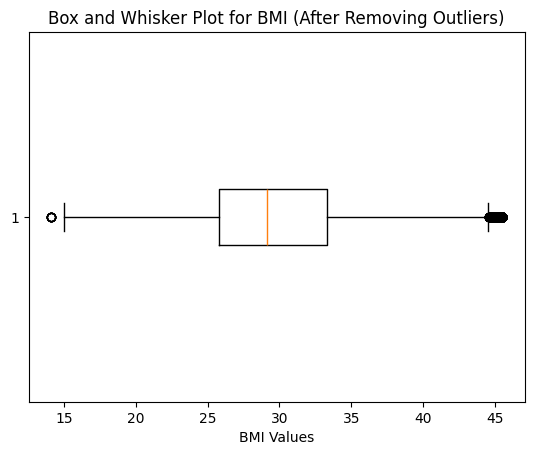

In [15]:
plt.boxplot(df_cleaned['bmi'], vert=False)
plt.xlabel('BMI Values')
plt.title('Box and Whisker Plot for BMI (After Removing Outliers)')
plt.show()

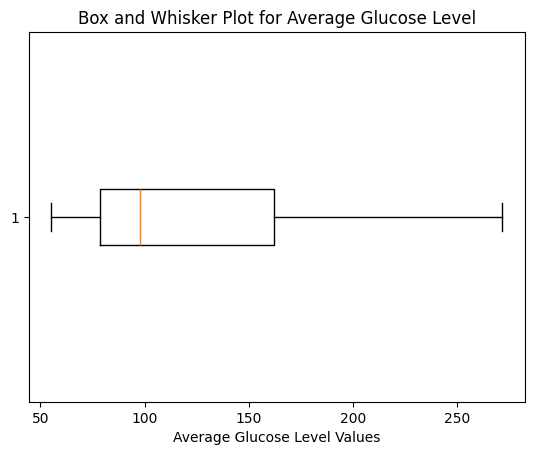

In [16]:
avg_gluc = df['avg_glucose_level'].tolist()

# Create a horizontal box and whisker plot
plt.boxplot(avg_gluc, vert=False)

# Customize labels and title
plt.xlabel('Average Glucose Level Values')
plt.title('Box and Whisker Plot for Average Glucose Level')

# Show the plot
plt.show()

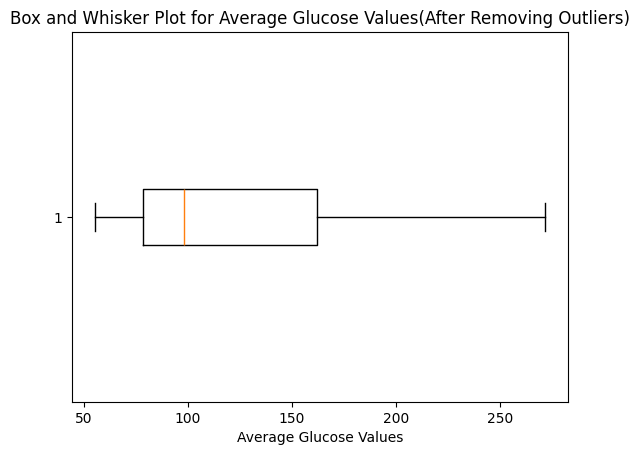

In [17]:
Q1 = df['avg_glucose_level'].quantile(0.25)
Q3 = df['avg_glucose_level'].quantile(0.75)
IQR = Q3 - Q1

# Define the lower and upper bounds for outlier removal
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Remove outliers
df_cleaned_gluc = df[(df['avg_glucose_level'] >= lower_bound) & (df['avg_glucose_level'] <= upper_bound)]


plt.boxplot(df_cleaned_gluc['avg_glucose_level'], vert=False)
plt.xlabel('Average Glucose Values')
plt.title('Box and Whisker Plot for Average Glucose Values(After Removing Outliers)')
plt.show()

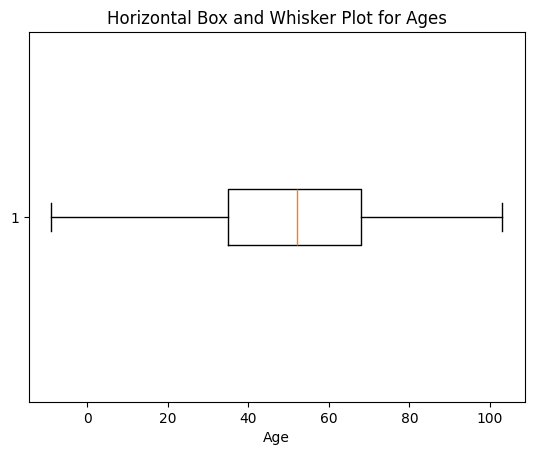

In [18]:
age = df['age'].tolist()

# Create a horizontal box and whisker plot
plt.boxplot(age, vert=False)

# Customize labels and title
plt.xlabel('Age')
plt.title('Horizontal Box and Whisker Plot for Ages')

# Show the plot
plt.show()

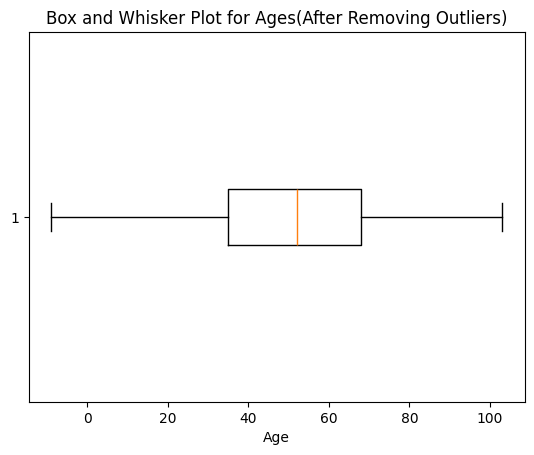

In [19]:
Q1 = df['age'].quantile(0.25)
Q3 = df['age'].quantile(0.75)
IQR = Q3 - Q1

# Define the lower and upper bounds for outlier removal
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Remove outliers
df_cleaned_gluc = df[(df['age'] >= lower_bound) & (df['age'] <= upper_bound)]


plt.boxplot(df_cleaned_gluc['age'], vert=False)
plt.xlabel('Age')
plt.title('Box and Whisker Plot for Ages(After Removing Outliers)')
plt.show()

In [20]:
print(df.shape)

(39985, 11)


922 data values were outliers (this amounts to 0.023% of the entire data set)

In [21]:
df.sample(3)

,sex,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
12698,0.0,14.0,0,0,1,4,1,110.85,24.1,1,1
17524,0.0,38.0,1,0,1,2,1,213.03,20.2,1,1
27577,1.0,57.0,0,0,0,2,1,68.98,23.4,1,0


In [22]:
df.query("avg_glucose_level < 100")

,sex,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
5,1.0,55.0,1,1,1,4,0,70.09,27.4,0,1
6,0.0,82.0,0,0,0,4,1,94.39,22.8,0,1
7,0.0,17.0,1,0,1,4,0,80.43,29.7,0,1
14,1.0,45.0,0,0,0,4,1,89.22,37.8,0,1
25,1.0,75.0,0,0,0,2,1,84.20,29.7,0,1
...,...,...,...,...,...,...,...,...,...,...,...
40902,0.0,64.0,0,0,1,3,1,99.68,17.6,1,0
40903,1.0,30.0,0,0,1,3,1,79.55,21.1,1,0
40904,1.0,60.0,0,0,1,4,0,87.86,29.0,1,0
40906,0.0,53.0,0,0,1,4,0,77.66,40.8,0,0


In [23]:
df.loc[25004,"age"]

np.float64(29.0)

In [24]:
df.iloc[25004,1]

np.float64(82.0)

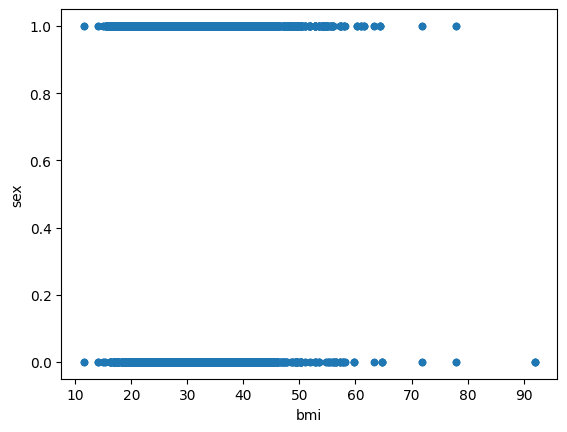

In [25]:
#Scatter plot of sex vs bmi
df.plot(x = 'bmi',y = 'sex',kind = 'scatter')
plt.show()

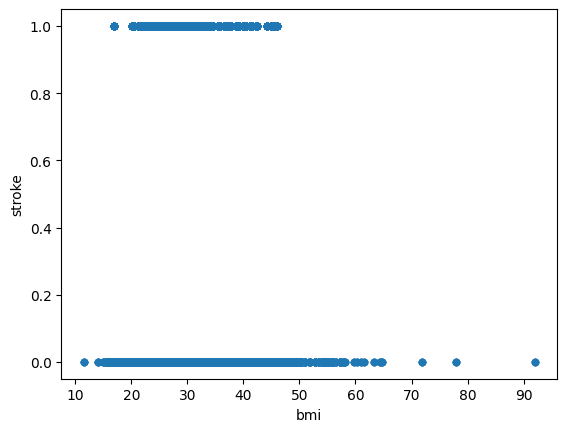

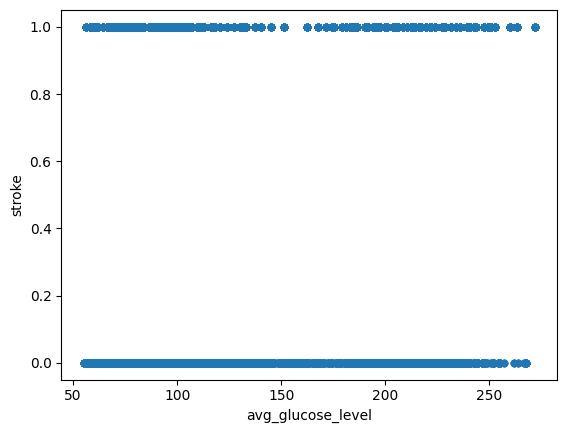

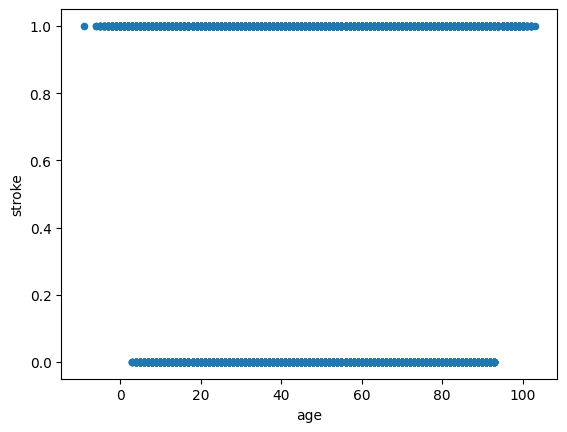

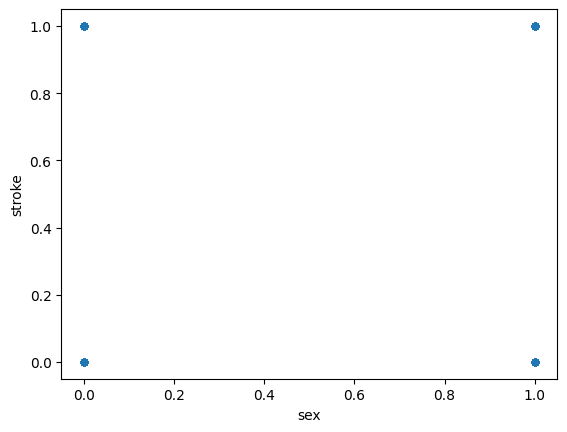

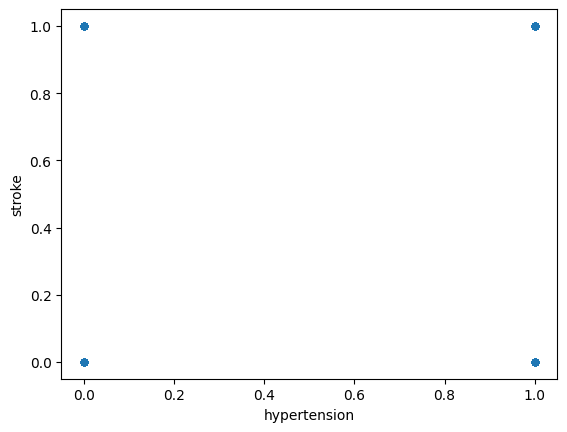

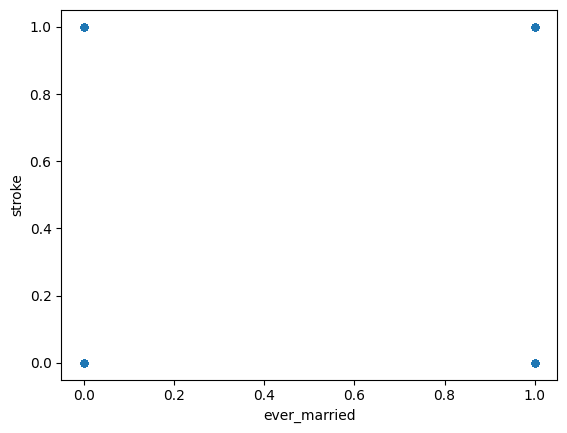

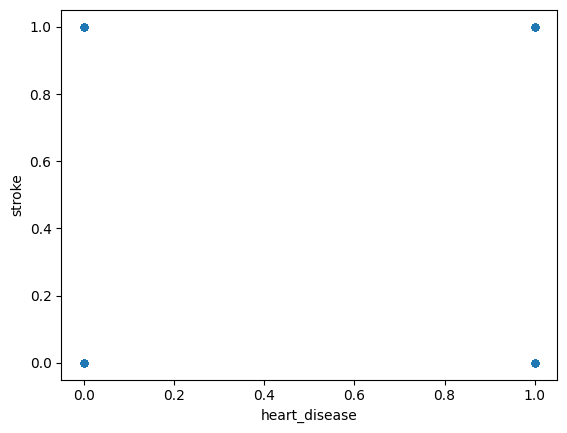

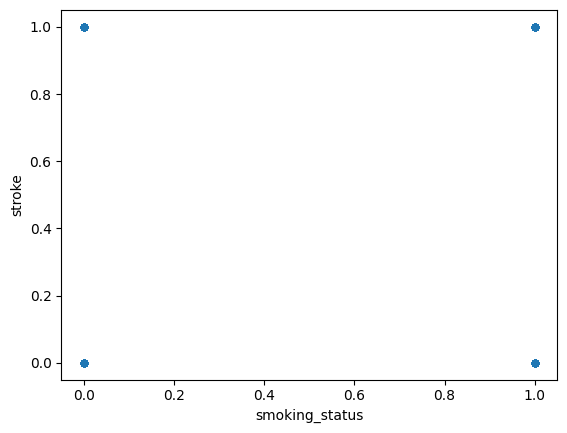

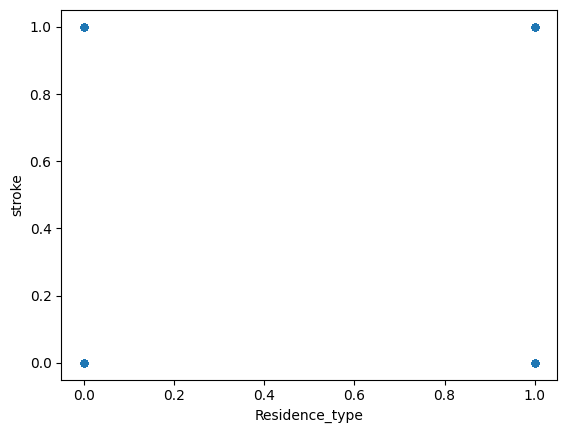

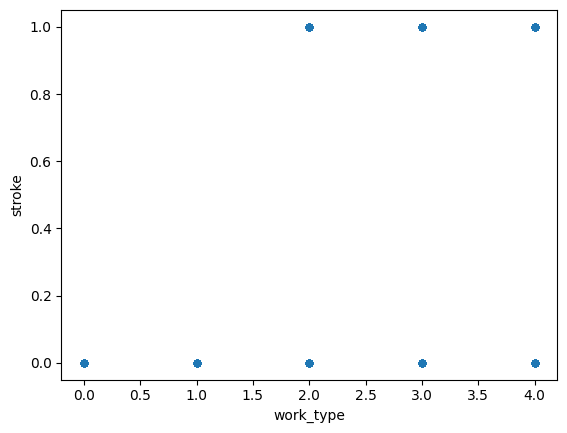

In [26]:
#Different sets of scatter plots
df.plot(x = 'bmi',y = 'stroke',kind = 'scatter')
df.plot(x = 'avg_glucose_level', y = 'stroke', kind = 'scatter')
df.plot(x = 'age', y = 'stroke', kind = 'scatter')
df.plot(x = 'sex', y = 'stroke', kind = 'scatter')
df.plot(x = 'hypertension', y = 'stroke', kind = 'scatter')
df.plot(x = 'ever_married', y = 'stroke', kind = 'scatter')
df.plot(x = 'heart_disease', y = 'stroke', kind = 'scatter')
df.plot(x = 'smoking_status', y = 'stroke', kind = 'scatter')
df.plot(x = 'Residence_type', y = 'stroke', kind = 'scatter')
df.plot(x = 'work_type', y = 'stroke', kind = 'scatter')

plt.show()

Age vs BMI -- No relationship
Avg_Glucose_Level vs BMI -- No relationship
Avg_glucose_level vs Age -- No relationship

array([[<Axes: title={'center': 'work_type'}>]], dtype=object)

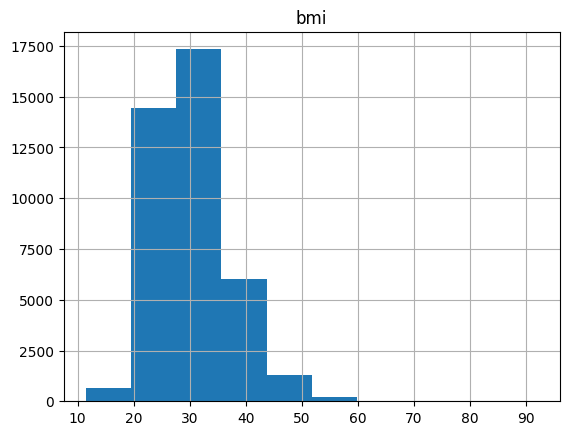

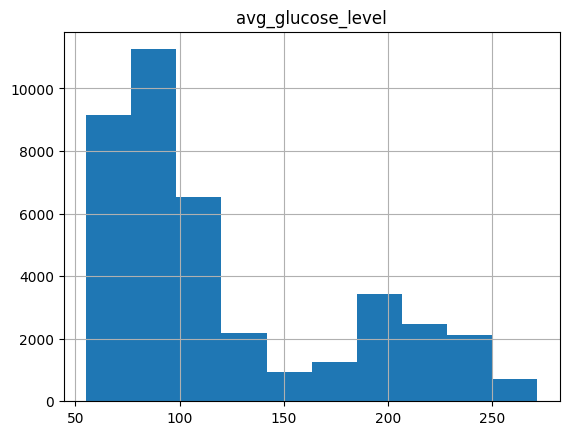

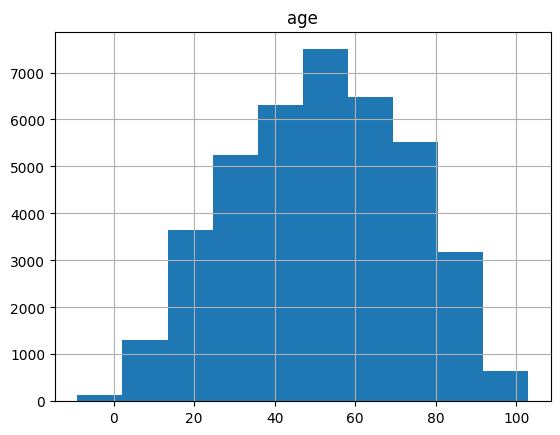

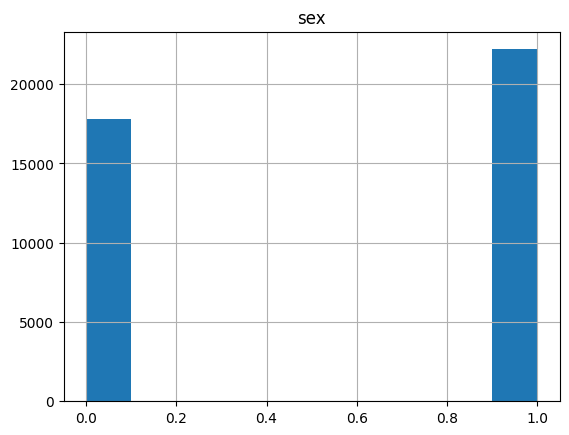

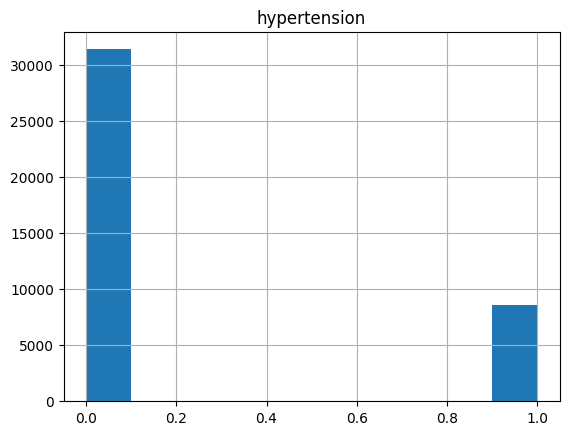

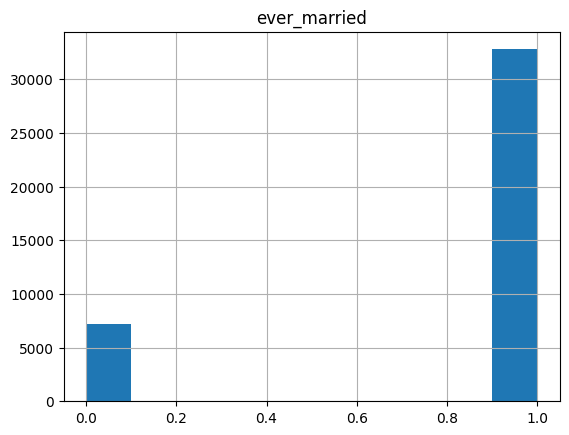

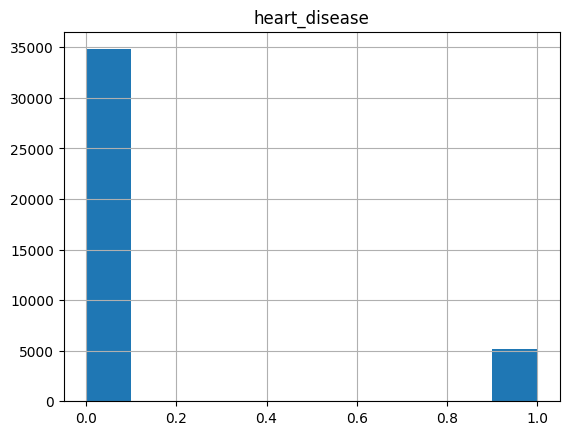

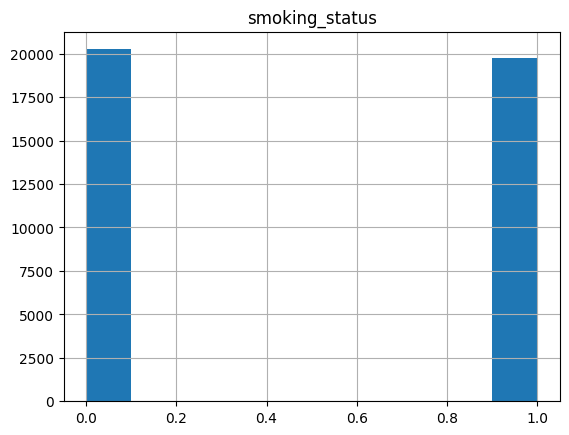

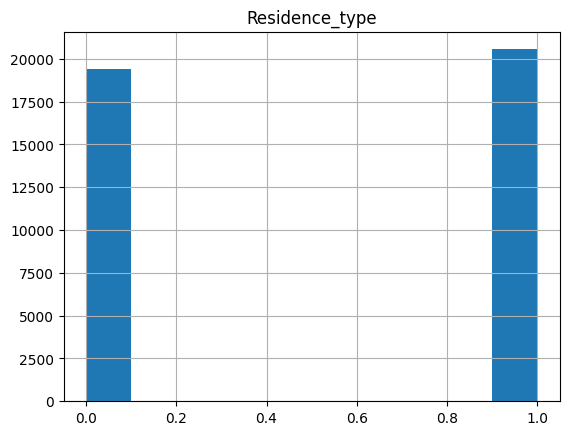

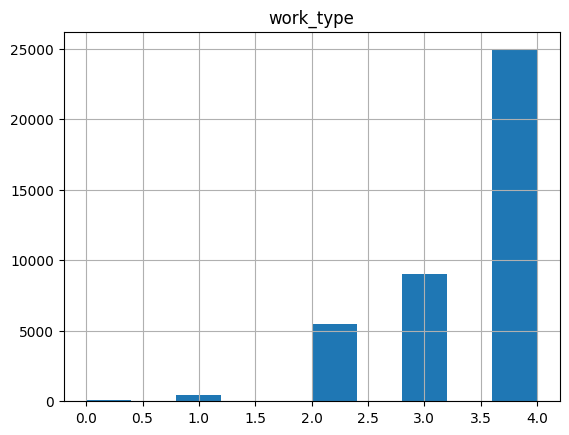

In [27]:
#Different set of histograms
df.hist(column = "bmi")
df.hist(column = "avg_glucose_level")
df.hist(column = "age")
df.hist(column = "sex")
df.hist(column = "hypertension")
df.hist(column = "ever_married")
df.hist(column = "heart_disease")
df.hist(column = "smoking_status")
df.hist(column = "Residence_type")
df.hist(column = "work_type")

BMI:
Center close to 30; right-skewed distribution

Average Glucose Level:
Center close to 110-120; bimodal distribution

Age:
Center close to 50; Normal distribution

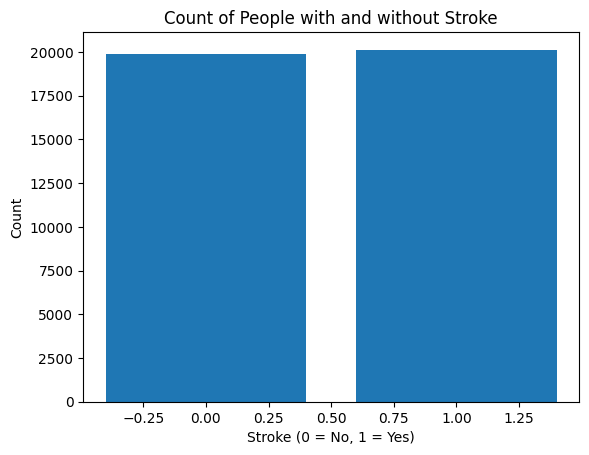

In [28]:
stroke_counts = df['stroke'].value_counts()

# Create a bar plot
plt.bar(stroke_counts.index, stroke_counts.values)

# Add labels and title
plt.xlabel('Stroke (0 = No, 1 = Yes)')
plt.ylabel('Count')
plt.title('Count of People with and without Stroke')

# Show the plot
plt.show()

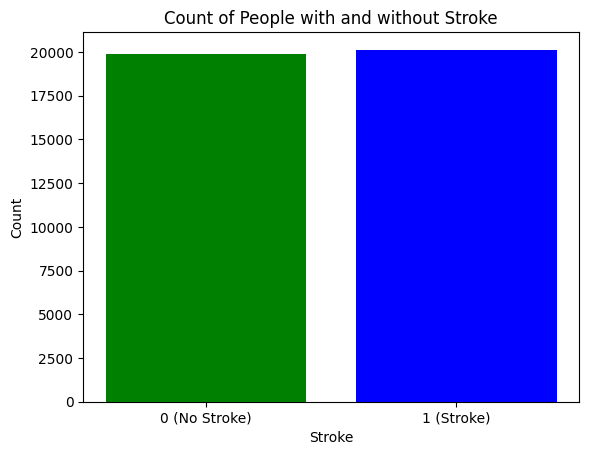

In [29]:

# Assuming you have a DataFrame named 'df' with a column 'stroke' containing 0s and 1s
# For example:
# df = pd.read_csv("your_dataset.csv")

# Use value_counts() to count the occurrences of each unique value in the 'stroke' column
stroke_counts = df['stroke'].value_counts()

# Define colors for the bars (e.g., blue for 0, green for 1)
colors = ['blue', 'green']

# Create a bar plot with specified colors
plt.bar(stroke_counts.index, stroke_counts.values, color=colors)

# Set the x-axis tick labels explicitly
plt.xticks([0, 1], ['0 (No Stroke)', '1 (Stroke)'])

# Add labels and title
plt.xlabel('Stroke')
plt.ylabel('Count')
plt.title('Count of People with and without Stroke')

# Show the plot
plt.show()

In [30]:
# Use value_counts() to count the occurrences of each unique value in the 'stroke' column
stroke_counts = df['stroke'].value_counts()

# Display the counts
print(stroke_counts)

stroke
1    20128
0    19857
Name: count, dtype: int64


In [31]:
df.corr()

,sex,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
sex,1.000000,-0.115016,-0.039547,-0.046127,-0.026376,0.003486,0.005638,-0.038707,-0.004290,-0.028564,-0.111800
age,-0.115016,1.000000,0.015141,0.023968,0.007508,0.005123,0.003294,0.031728,-0.007345,-0.004355,0.061126
hypertension,-0.039547,0.015141,1.000000,0.081511,0.031681,-0.029006,-0.008527,0.201547,0.079822,-0.016606,0.256143
heart_disease,-0.046127,0.023968,0.081511,1.000000,0.072902,0.050960,0.013508,0.261593,0.034200,0.135430,0.228751
ever_married,-0.026376,0.007508,0.031681,0.072902,1.000000,0.050295,-0.060244,0.155439,0.108445,0.143260,0.181092
work_type,0.003486,0.005123,-0.029006,0.050960,0.050295,1.000000,-0.009960,0.015280,0.071200,0.055525,0.025474
Residence_type,0.005638,0.003294,-0.008527,0.013508,-0.060244,-0.009960,1.000000,0.012450,0.035579,0.021465,0.007489
avg_glucose_level,-0.038707,0.031728,0.201547,0.261593,0.155439,0.015280,0.012450,1.000000,0.212157,0.072485,0.256123
bmi,-0.004290,-0.007345,0.079822,0.034200,0.108445,0.071200,0.035579,0.212157,1.000000,0.069822,-0.001345
smoking_status,-0.028564,-0.004355,-0.016606,0.135430,0.143260,0.055525,0.021465,0.072485,0.069822,1.000000,0.076451


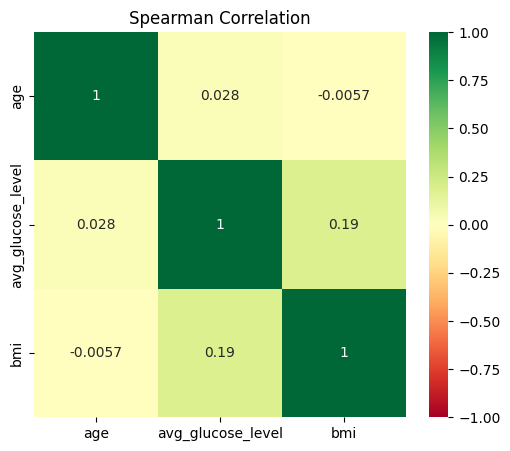

In [32]:
features_num = ['age', 'avg_glucose_level','bmi']

corr_spearman = df[features_num].corr(method='spearman')

fig = plt.figure(figsize = (6,5))
sns.heatmap(corr_spearman, annot=True, cmap="RdYlGn", vmin=-1, vmax=+1)
plt.title('Spearman Correlation')
plt.show()

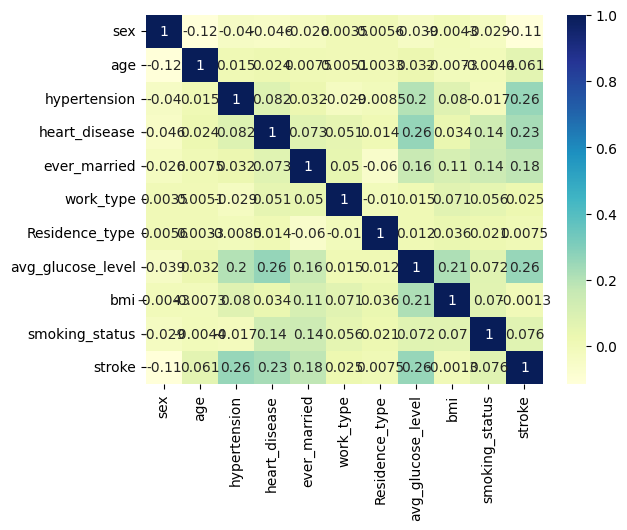

In [33]:
#Showing a set of correlation between all the different parameter values
dataplot = sns.heatmap(df.corr(), cmap="YlGnBu", annot=True)
plt.show()


#REMOVE STROKE FROM TABLE

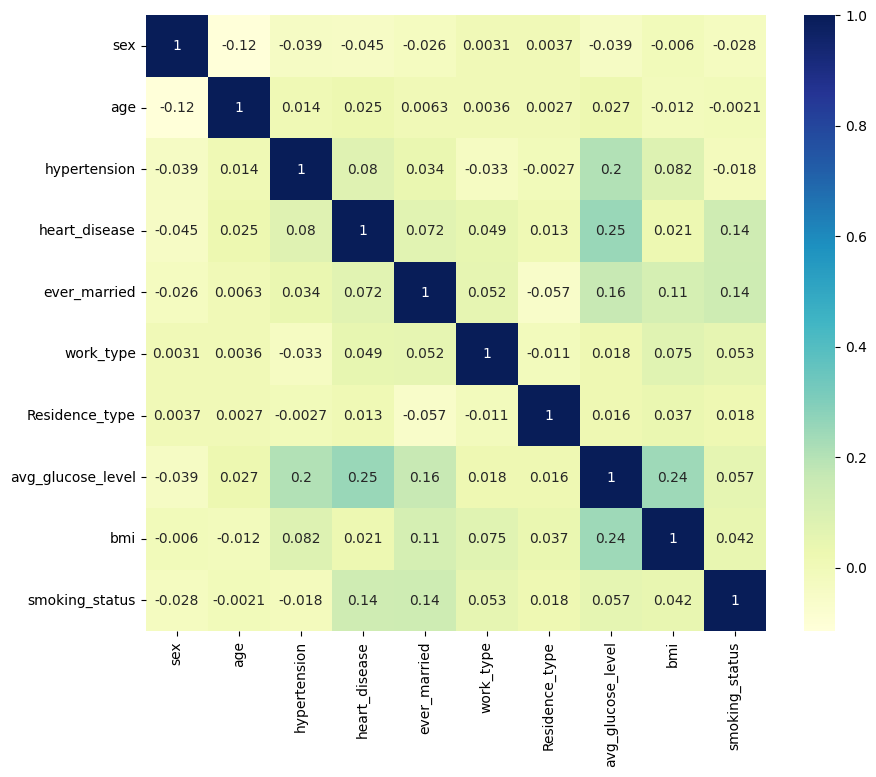

In [34]:
#Showing a set of correlation between all the different parameter values
plt.figure(figsize=(10, 8))
dataplot = sns.heatmap(tf.corr(), cmap="YlGnBu", annot=True)
plt.show()

High Correlation: > 0.8 or < -0.8
No high correlations in this data set

Low Correlation: close to 0.00

We can show distinct effect of the different variables.

In [35]:
#Showing scatter plot of all the different sets of parameters with each other, keeping the marriage out of this set
#sns.pairplot(df.drop('ever_married', axis = 1))

<Axes: >

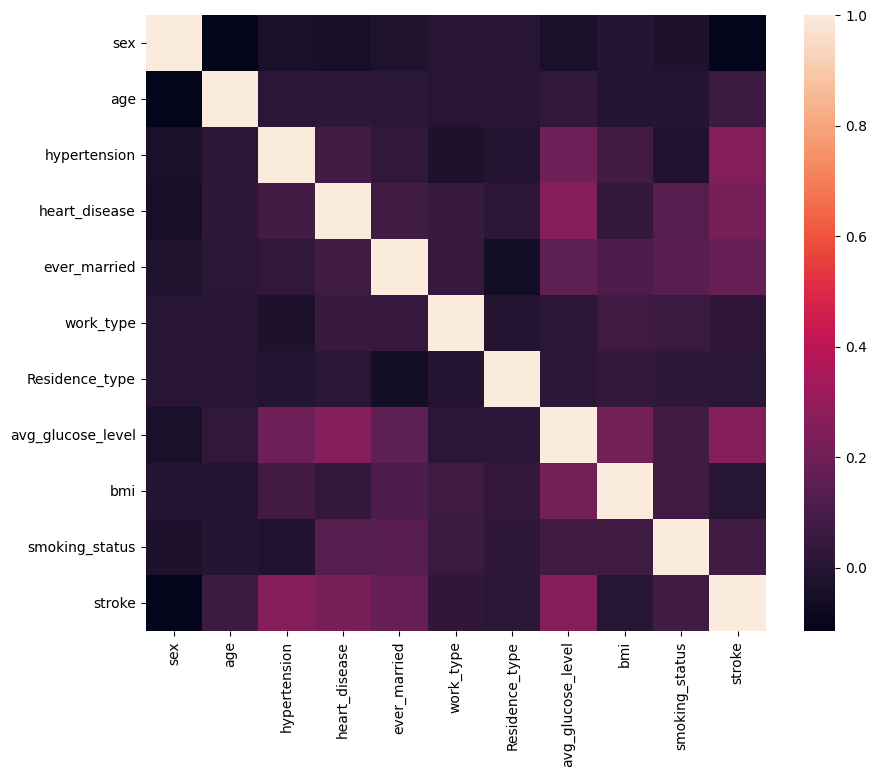

In [36]:
plt.figure(figsize=(10, 8))
sns.heatmap(df.corr(),
                xticklabels=df.columns,
                yticklabels=df.columns)


<Axes: >

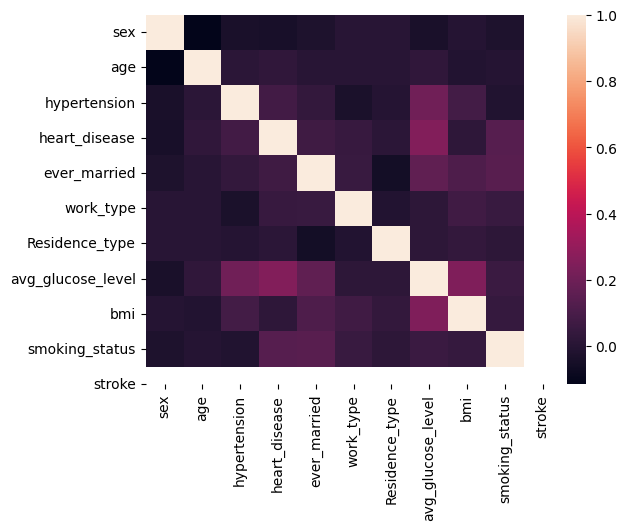

In [37]:
sns.heatmap(tf.corr(),
            xticklabels=df.columns,
            yticklabels=df.columns)

#REMOVE STROKE FROM TABLE

Appears as if there is not data with high correlation to stroke.

In [38]:
#Scaling the data to fit under the same set of axes so that there is no significant influence of one parameter over the other
standard = preprocessing.scale(df)
print(standard)

[[ 0.89510182  0.53685174 -0.52234101 ...  0.97701016  1.01321726
   0.99324527]
 [ 0.89510182 -0.43335745 -0.52234101 ...  0.35050048 -0.98695515
   0.99324527]
 [-1.11719134  0.44445087 -0.52234101 ...  0.64083424  1.01321726
   0.99324527]
 ...
 [ 0.89510182 -0.89536183 -0.52234101 ...  0.45746555 -0.98695515
  -1.00680067]
 [ 0.89510182 -0.43335745 -0.52234101 ...  0.65611496 -0.98695515
  -1.00680067]
 [ 0.89510182 -0.75676051 -0.52234101 ... -0.33713209 -0.98695515
  -1.00680067]]


In [39]:
#Seperating the dataframe into two tables: one with only stroke and one with every parameter other than stroke
Z = df.drop(['stroke'],axis=1)
Z.head()

,sex,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status
0,1.0,63.0,0,1,1,4,1,228.69,36.6,1
1,1.0,42.0,0,1,1,4,0,105.92,32.5,0
2,0.0,61.0,0,0,1,4,1,171.23,34.4,1
3,1.0,41.0,1,0,1,3,0,174.12,24.0,0
4,1.0,85.0,0,0,1,4,1,186.21,29.0,1


In [40]:
W = df.drop(df.columns[[0,1,2,3,4,5,6,7,8]],axis = 1)
W.tail()

,smoking_status,stroke
40905,1,0
40906,0,0
40907,0,0
40908,0,0
40909,0,0


In [41]:
#Scaling data for non-storke values
standardIV = preprocessing.scale(Z)
print(standardIV)

[[ 0.89510182  0.53685174 -0.52234101 ...  1.87973963  0.97701016
   1.01321726]
 [ 0.89510182 -0.43335745 -0.52234101 ... -0.2703362   0.35050048
  -0.98695515]
 [-1.11719134  0.44445087 -0.52234101 ...  0.87344039  0.64083424
   1.01321726]
 ...
 [ 0.89510182 -0.89536183 -0.52234101 ...  1.93683213  0.45746555
  -0.98695515]
 [ 0.89510182 -0.43335745 -0.52234101 ...  1.66415411  0.65611496
  -0.98695515]
 [ 0.89510182 -0.75676051 -0.52234101 ... -0.46140345 -0.33713209
  -0.98695515]]


In [42]:
X = df.drop(['stroke'], axis=1)

y = df['stroke']

In [43]:
#Train-test split of 70-30%; the models produced were better with 70-30 split compared to 80-20
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 42)

Model accuracy was better with 70-30 split rather than 80-20 split

In [44]:
#Difference in size between training and testing data
X_train.shape, X_test.shape

((27989, 10), (11996, 10))

In [45]:
#Random Forest Classifier builds decision trees on different samples and takes their majority vote for classification and average in case of regression
from sklearn.ensemble import RandomForestClassifier

# instantiate the classifier
rfc = RandomForestClassifier(random_state=0)

# fit the model
rfc.fit(X_train, y_train)

# Predict the Test set results
y_pred = rfc.predict(X_test)

# Check accuracy score
from sklearn.metrics import accuracy_score

print('Model accuracy score with 10 decision-trees : {0:0.4f}'. format(accuracy_score(y_test, y_pred)))

Model accuracy score with 10 decision-trees : 0.9981


In [46]:
# instantiate the classifier with n_estimators = 100
rfc_100 = RandomForestClassifier(n_estimators=100, random_state=0)

# fit the model to the training set
rfc_100.fit(X_train, y_train)

# Predict on the test set results
y_pred_100 = rfc_100.predict(X_test)


# Check accuracy score
print('Model accuracy score with 100 decision-trees : {0:0.4f}'. format(accuracy_score(y_test, y_pred_100)))

Model accuracy score with 100 decision-trees : 0.9981


In [47]:
#View the feature scores
feature_scores = pd.Series(rfc.feature_importances_, index=X_train.columns).sort_values(ascending=False)
feature_scores

#None of the features have a very significant effect on the data so there shouldn't be much of an effect

,0
avg_glucose_level,0.379499
bmi,0.307611
work_type,0.057362
hypertension,0.057316
age,0.050926
heart_disease,0.038626
ever_married,0.035170
Residence_type,0.033696
smoking_status,0.031627
sex,0.008167


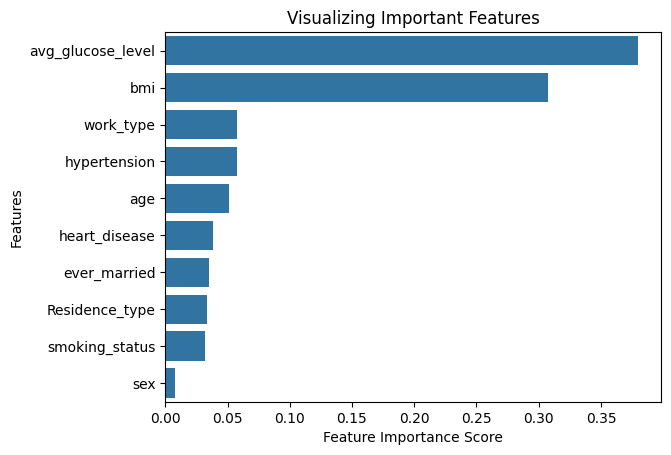

In [48]:
# Creating a seaborn bar plot to investigate the feature scores
sns.barplot(x=feature_scores, y=feature_scores.index)

# Add labels to the graph
plt.xlabel('Feature Importance Score')
plt.ylabel('Features')

# Add title to the graph
plt.title("Visualizing Important Features")

# Visualize the graph
plt.show()

10 vs 100 estimators has no effect on the data accuracy

In [49]:
# create the classifier with n_estimators = 100
clf = RandomForestClassifier(n_estimators=100, random_state=0)

# fit the model to the training set
clf.fit(X_train, y_train)

RandomForestClassifier(random_state=0)

In [50]:
#View the feature scores
feature_scores = pd.Series(clf.feature_importances_, index=X_train.columns).sort_values(ascending=False)
feature_scores

#None of the features have a very significant effect on the data so there shouldn't be much of an effect

,0
avg_glucose_level,0.379499
bmi,0.307611
work_type,0.057362
hypertension,0.057316
age,0.050926
heart_disease,0.038626
ever_married,0.035170
Residence_type,0.033696
smoking_status,0.031627
sex,0.008167


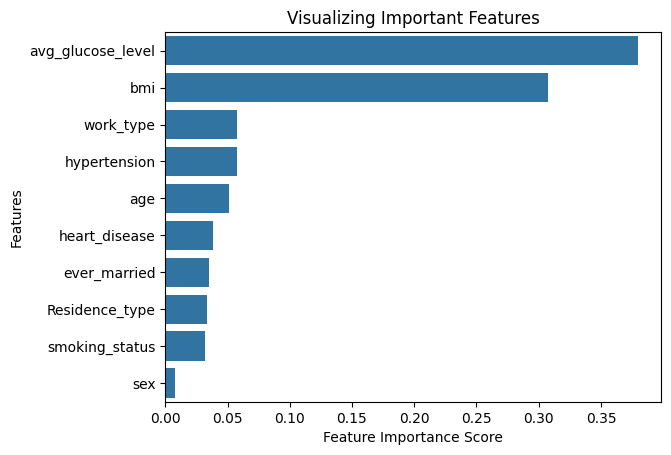

In [51]:
# Creating a seaborn bar plot to investigate the feature scores
sns.barplot(x=feature_scores, y=feature_scores.index)

# Add labels to the graph
plt.xlabel('Feature Importance Score')
plt.ylabel('Features')

# Add title to the graph
plt.title("Visualizing Important Features")

# Visualize the graph
plt.show()

Including features even with score < 0.05 because it helps with model accuracy without resulting in overfitting

In [52]:
# Print the Confusion Matrix and slice it into four pieces
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, y_pred)
print('Confusion matrix\n\n', cm)

Confusion matrix

 [[5929   23]
 [   0 6044]]


In [53]:
#Classification report for the data set
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      5952
           1       1.00      1.00      1.00      6044

    accuracy                           1.00     11996
   macro avg       1.00      1.00      1.00     11996
weighted avg       1.00      1.00      1.00     11996



In [54]:
from sklearn.metrics import f1_score, roc_auc_score, precision_score, recall_score, roc_curve, classification_report

f1 = f1_score(y_test, y_pred)
print(f"F1 Score: {f1:.4f}")


roc_auc = roc_auc_score(y_test, y_pred)
print(f"AUC: {roc_auc:.4f}")


precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")

F1 Score: 0.9981
AUC: 0.9981
Precision: 0.9962
Recall: 1.0000


array([[<Axes: title={'center': 'stroke'}>]], dtype=object)

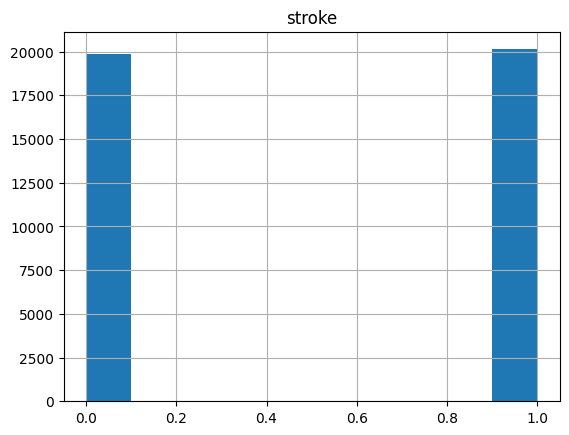

In [55]:
#The data of the strokes are balanced (having and not having stroke)
df.hist(column = "stroke")

Text(0.5, 427.9555555555555, 'Predicted label')

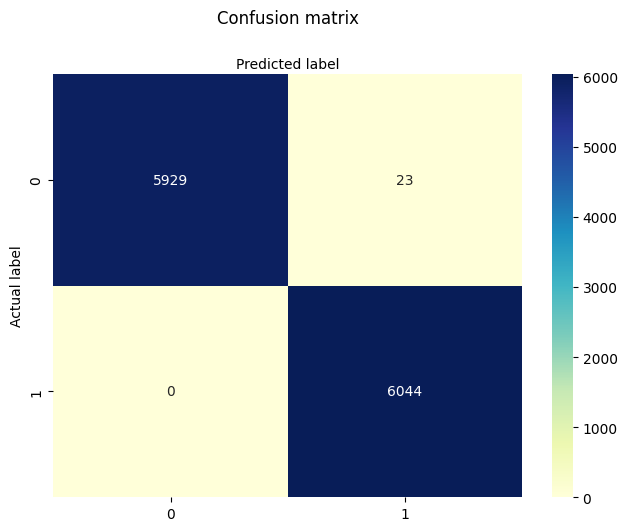

In [56]:
#Confusion Matrix
class_names=[0,1] # name  of classes
fig, ax = plt.subplots()
tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names)
plt.yticks(tick_marks, class_names)
# create heatmap
sns.heatmap(pd.DataFrame(cm), annot=True, cmap="YlGnBu" ,fmt='g')
ax.xaxis.set_label_position("top")
plt.tight_layout()
plt.title('Confusion matrix', y=1.1)
plt.ylabel('Actual label')
plt.xlabel('Predicted label')

In [57]:
#Creating Logistic Regression Model

#import the class
from sklearn.linear_model import LogisticRegression

# instantiate the model (using the default parameters)
logreg = LogisticRegression(random_state=16)

# fit the model with data
logreg.fit(X_train, y_train)

y_pred = logreg.predict(X_test)

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [58]:
# Print the Confusion Matrix and slice it into four pieces
from sklearn.metrics import confusion_matrix
from sklearn import metrics

cm = confusion_matrix(y_test, y_pred)
print('Confusion matrix\n\n', cm)
print(metrics.classification_report(y_test,y_pred))

Confusion matrix

 [[4439 1513]
 [2325 3719]]
              precision    recall  f1-score   support

           0       0.66      0.75      0.70      5952
           1       0.71      0.62      0.66      6044

    accuracy                           0.68     11996
   macro avg       0.68      0.68      0.68     11996
weighted avg       0.68      0.68      0.68     11996



Text(0.5, 23.52222222222222, 'Predicted label')

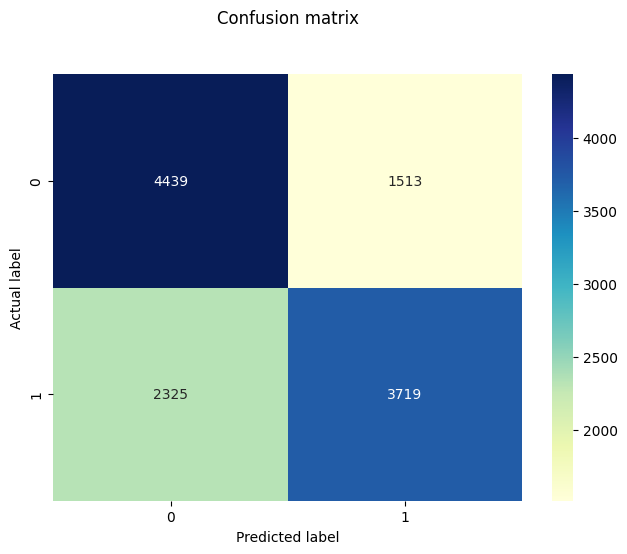

In [59]:
#CNN Heatmap for Logistic Regression Model
sns.heatmap(pd.DataFrame(cm), annot=True, cmap="YlGnBu" ,fmt='g')
ax.xaxis.set_label_position("top")
plt.tight_layout()
plt.title('Confusion matrix', y=1.1)
plt.ylabel('Actual label')
plt.xlabel('Predicted label')

In [60]:
from sklearn.metrics import accuracy_score
from sklearn.datasets import make_classification

In [61]:
#Testing Accuracy Model for Logistic Regression
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

Accuracy: 0.6800600200066689


In [62]:
#F1 Score
import numpy as np
from sklearn.metrics import f1_score

#define array of actual classes
actual = np.repeat([1, 0], repeats=[5952, 6044])

#define array of predicted classes
pred = np.repeat([1, 0, 1, 0], repeats=[5929, 23, 0, 6044])

#calculate F1 score for LogReg model
f1_score(actual, pred)

0.9980641360154869

In [63]:
#Area Under Curve (AUC) Valuation
from sklearn import metrics
#use model to predict probability that given y value is 1
y_pred_proba = logreg.predict_proba(X_test)[::,1]

#calculate AUC of model
auc = metrics.roc_auc_score(y_test, y_pred_proba)

#print AUC score
print(auc)

0.7443039517997054


In [64]:
precision = precision_score(y_test, y_pred)
print(f"Precision Score: {precision:.4f}")

Precision Score: 0.7108


In [65]:
from sklearn.metrics import recall_score, classification_report
recall = recall_score(y_test, y_pred)
print(f"Recall Score: {recall:.4f}")

Recall Score: 0.6153


In [66]:
#KNN (K-nearest neighbors) Model
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier(n_neighbors=7)
knn.fit(X_train, y_train)

# Predict on dataset which model has not seen before
print(knn.predict(X_test))

[1 1 0 ... 1 1 1]


Cross Validation can be used to find the optimal number of neighbors.

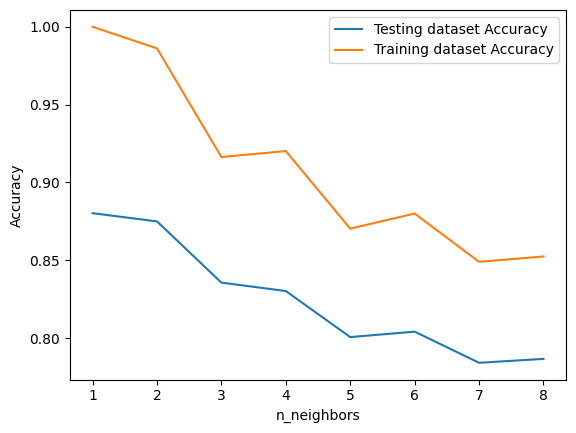

In [67]:
#To check for accuracy of KNN model
neighbors = np.arange(1, 9)
train_accuracy = np.empty(len(neighbors))
test_accuracy = np.empty(len(neighbors))

# Loop over K values
for i, k in enumerate(neighbors):
    knn = KNeighborsClassifier(n_neighbors=k)
    knn.fit(X_train, y_train)

    # Compute training and test data accuracy
    train_accuracy[i] = knn.score(X_train, y_train)
    test_accuracy[i] = knn.score(X_test, y_test)

# Generate plot
plt.plot(neighbors, test_accuracy, label = 'Testing dataset Accuracy')
plt.plot(neighbors, train_accuracy, label = 'Training dataset Accuracy')

plt.legend()
plt.xlabel('n_neighbors')
plt.ylabel('Accuracy')
plt.show()

In [68]:
#Comparing between 1 and 2 neighbors
knn = KNeighborsClassifier(n_neighbors=2)
knn.fit(X_train, y_train)
y_pred = knn.predict(X_test)
print(metrics.accuracy_score(y_test, y_pred))

0.8749583194398133


In [69]:
knn = KNeighborsClassifier(n_neighbors=1)
knn.fit(X_train, y_train)
y_pred = knn.predict(X_test)
print(metrics.accuracy_score(y_test, y_pred))

0.8802100700233411


KNN has better accuracy than the logistic regression model for accuracy score but F1 score for logreg is much higher

In [70]:
#Test Accuracy Score
accuracyKNN = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracyKNN)
print(knn.score(X_test,y_test))

Accuracy: 0.8802100700233411
0.8802100700233411


In [71]:
#Confusion matrix for KNN Model
cmKNN = metrics.confusion_matrix(y_test, y_pred)
print(cmKNN)
print(metrics.classification_report(y_test,y_pred))

[[4645 1307]
 [ 130 5914]]
              precision    recall  f1-score   support

           0       0.97      0.78      0.87      5952
           1       0.82      0.98      0.89      6044

    accuracy                           0.88     11996
   macro avg       0.90      0.88      0.88     11996
weighted avg       0.90      0.88      0.88     11996



Text(0.5, 23.52222222222222, 'Predicted label')

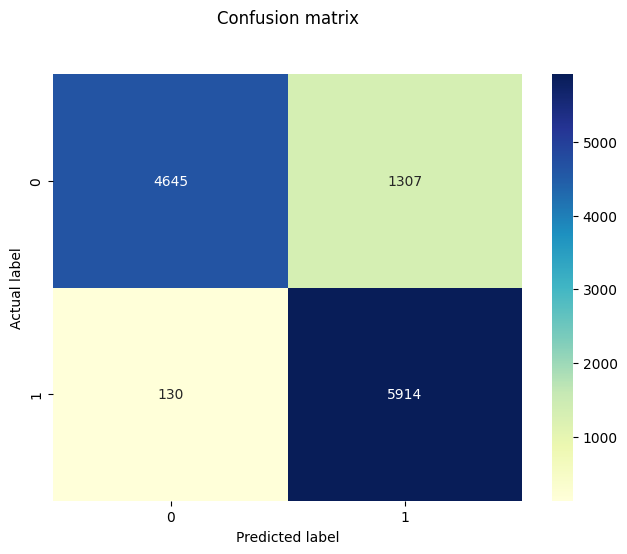

In [72]:
#CNN Heatmap for KNN Model
sns.heatmap(pd.DataFrame(cmKNN), annot=True, cmap="YlGnBu" ,fmt='g')
ax.xaxis.set_label_position("top")
plt.tight_layout()
plt.title('Confusion matrix', y=1.1)
plt.ylabel('Actual label')
plt.xlabel('Predicted label')

In [73]:
#F1 Score
import numpy as np
from sklearn.metrics import f1_score

#define array of actual classes
actualKNN = np.repeat([1, 0], repeats=[5952, 6044])

#define array of predicted classes
predKNN = np.repeat([1, 0, 1, 0], repeats=[4645, 1307, 130, 5914])

#calculate F1 score
f1_score(actualKNN, predKNN)

0.8660389670923837

In [74]:
#AUC Valuation for KNN
from sklearn import metrics
#use model to predict probability that given y value is 1
y_pred_proba = knn.predict_proba(X_test)[::,1]

#calculate AUC of model
auc = metrics.roc_auc_score(y_test, y_pred_proba)

#print AUC score
print(auc)

0.8794505058780414


In [75]:
precision = precision_score(y_test, y_pred)
print(f"Precision Score: {precision:.4f}")

Precision Score: 0.8190


In [76]:
recall = recall_score(y_test, y_pred)
print(f"Recall Score: {recall:.4f}")

Recall Score: 0.9785


In [77]:
#SVM Model
from seaborn import load_dataset, pairplot
from sklearn.svm import SVC

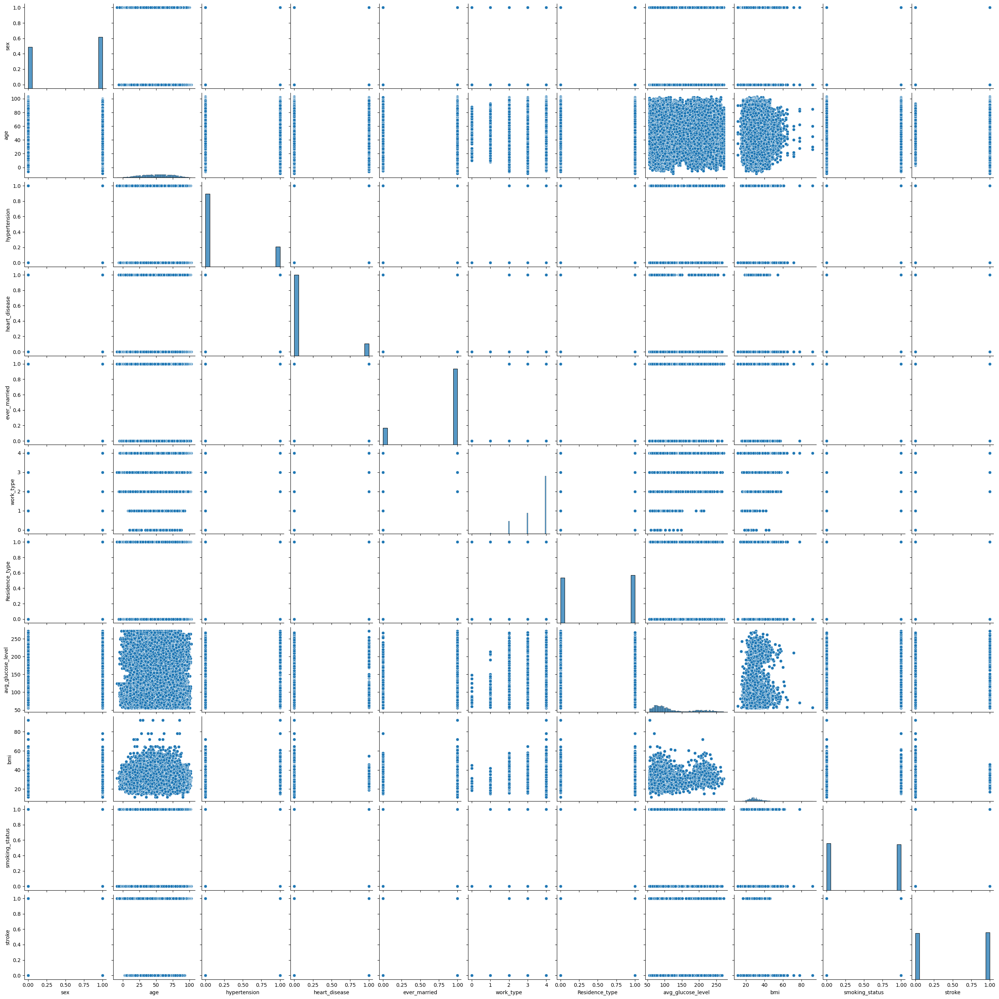

In [78]:
pairplot(df)
plt.show()

In [79]:
classifier = SVC(kernel='rbf', random_state = 1)
classifier.fit(X_train,y_train)

SVC(random_state=1)

In [80]:
y_predSVM = classifier.predict(X_test)

In [81]:
svm = SVC(kernel='rbf', random_state=0, gamma=.10, C=1.0)
svm.fit(X_train, y_train)

print('The accuracy of the svm classifier on training data is {:.2f} out of 1'.format(svm.score(X_train, y_train)))
print('The accuracy of the svm classifier on test data is {:.2f} out of 1'.format(svm.score(X_test, y_test)))

The accuracy of the svm classifier on training data is 0.95 out of 1
The accuracy of the svm classifier on test data is 0.86 out of 1


In [82]:
y_pred = svm.predict(X_test)
accuracySVM = accuracy_score(y_test, y_pred)
print(accuracySVM)

0.8641213737912637


In [83]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.90      0.82      0.86      5952
           1       0.84      0.91      0.87      6044

    accuracy                           0.86     11996
   macro avg       0.87      0.86      0.86     11996
weighted avg       0.87      0.86      0.86     11996



In [84]:
#Confusion matrix for KNN Model
cmSVM = metrics.confusion_matrix(y_test, y_pred)
print(cmSVM)
print(metrics.classification_report(y_test,y_pred))

[[4889 1063]
 [ 567 5477]]
              precision    recall  f1-score   support

           0       0.90      0.82      0.86      5952
           1       0.84      0.91      0.87      6044

    accuracy                           0.86     11996
   macro avg       0.87      0.86      0.86     11996
weighted avg       0.87      0.86      0.86     11996



Text(0.5, 23.52222222222222, 'Predicted label')

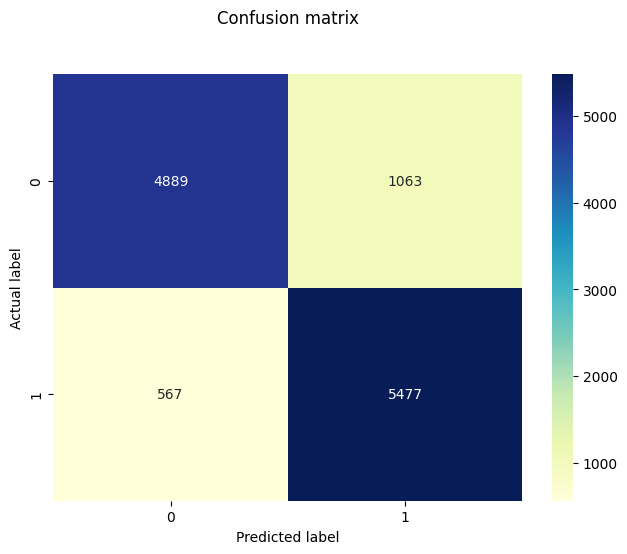

In [85]:
sns.heatmap(pd.DataFrame(cmSVM), annot=True, cmap="YlGnBu" ,fmt='g')
ax.xaxis.set_label_position("top")
plt.tight_layout()
plt.title('Confusion matrix', y=1.1)
plt.ylabel('Actual label')
plt.xlabel('Predicted label')

In [86]:
#AUC for SVM Classifier
print("area under curve (auc): ", metrics.roc_auc_score(y_test,y_pred))

area under curve (auc):  0.863796262444582


In [87]:
precision = precision_score(y_test, y_pred)
print(f"Precision Score: {precision:.4f}")

recall = recall_score(y_test, y_pred)
print(f"Recall Score: {recall:.4f}")

Precision Score: 0.8375
Recall Score: 0.9062


In [88]:
f1 = f1_score(y_test, y_pred)
print(f"F1 Score: {f1:.4f}")

F1 Score: 0.8705


In [89]:
knn = KNeighborsClassifier(n_neighbors=1, p=2, metric='minkowski')
knn.fit(X_train, y_train)

print('The accuracy of the knn classifier is {:.2f} out of 1 on training data'.format(knn.score(X_train, y_train)))
print('The accuracy of the knn classifier is {:.2f} out of 1 on test data'.format(knn.score(X_test, y_test)))

The accuracy of the knn classifier is 1.00 out of 1 on training data
The accuracy of the knn classifier is 0.88 out of 1 on test data


In [90]:
import xgboost as xgb

xgb_clf = xgb.XGBClassifier()
xgb_clf = xgb_clf.fit(X_train, y_train)

print('The accuracy of the xgb classifier is {:.2f} out of 1 on training data'.format(xgb_clf.score(X_train, y_train)))
print('The accuracy of the xgb classifier is {:.2f} out of 1 on test data'.format(xgb_clf.score(X_test, y_test)))

The accuracy of the xgb classifier is 1.00 out of 1 on training data
The accuracy of the xgb classifier is 1.00 out of 1 on test data


In [91]:
from xgboost import XGBClassifier


# declare parameters
params = {
            'objective':'binary:logistic',
            'max_depth': 4,
            'alpha': 10,
            'learning_rate': 1.0,
            'n_estimators':100
        }


# instantiate the classifier
xgb_clf = XGBClassifier(**params)


# fit the classifier to the training data
xgb_clf.fit(X_train, y_train)


XGBClassifier(alpha=10, base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=1.0, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=4, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=100, n_jobs=None,
              num_parallel_tree=None, ...)

In [92]:
print(xgb_clf)

XGBClassifier(alpha=10, base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=1.0, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=4, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=100, n_jobs=None,
              num_parallel_tree=None, ...)


In [93]:
#Accuracy score for XGB
y_pred = xgb_clf.predict(X_test)
print('XGBoost model accuracy score: {0:0.4f}'. format(accuracy_score(y_test, y_pred)))

XGBoost model accuracy score: 0.9887


In [94]:
import xgboost as xgb


# define data_dmatrix
data_dmatrix = xgb.DMatrix(data=X,label=y)

In [95]:
from xgboost import cv

params = {"objective":"binary:logistic",'colsample_bytree': 0.3,'learning_rate': 0.1,
                'max_depth': 5, 'alpha': 10}

xgb_cv = cv(dtrain=data_dmatrix, params=params, nfold=3,
                    num_boost_round=50, early_stopping_rounds=10, metrics="auc", as_pandas=True, seed=123)

In [96]:
xgb_cv.head()

,train-auc-mean,train-auc-std,test-auc-mean,test-auc-std
0,0.619647,0.000507,0.615748,0.004492
1,0.643308,0.007549,0.639487,0.011241
2,0.732280,0.004406,0.730285,0.005193
3,0.776966,0.003965,0.774130,0.006288
4,0.801344,0.003078,0.798493,0.004513


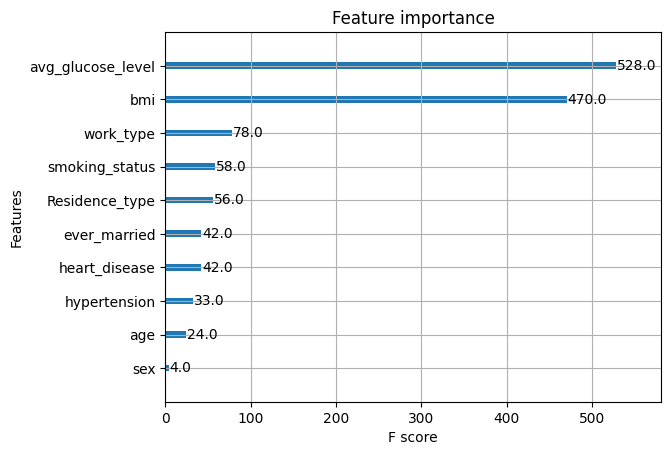

<Figure size 1600x1200 with 0 Axes>

In [97]:
xgb.plot_importance(xgb_clf)
plt.figure(figsize = (16, 12))
plt.show()

In [98]:
#AUC for XGboost Classifier
print("area under curve (auc): ", metrics.roc_auc_score(y_test,y_pred))

area under curve (auc):  0.9886592741935484


In [99]:
f1 = f1_score(y_test, y_pred)
print(f"F1 Score: {f1:.4f}")

F1 Score: 0.9890


Other models: Decision trees, random forest, bagging

In [100]:
precision = precision_score(y_test, y_pred)
print(f"Precision Score: {precision:.4f}")

recall = recall_score(y_test, y_pred)
print(f"Recall Score: {recall:.4f}")

Precision Score: 0.9782
Recall Score: 1.0000


In [101]:
#Confusion matrix for KNN Model
cmXGB = metrics.confusion_matrix(y_test, y_pred)
print(cmXGB)
print(metrics.classification_report(y_test,y_pred))

[[5817  135]
 [   0 6044]]
              precision    recall  f1-score   support

           0       1.00      0.98      0.99      5952
           1       0.98      1.00      0.99      6044

    accuracy                           0.99     11996
   macro avg       0.99      0.99      0.99     11996
weighted avg       0.99      0.99      0.99     11996



Text(0.5, 23.52222222222222, 'Predicted label')

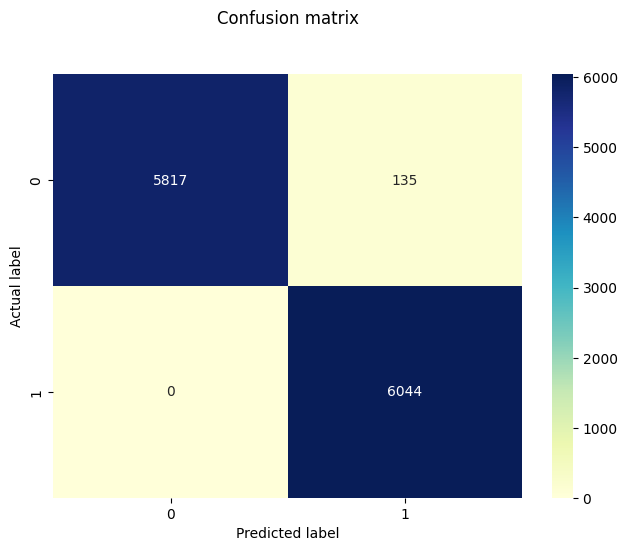

In [102]:
sns.heatmap(pd.DataFrame(cmXGB), annot=True, cmap="YlGnBu" ,fmt='g')
ax.xaxis.set_label_position("top")
plt.tight_layout()
plt.title('Confusion matrix', y=1.1)
plt.ylabel('Actual label')
plt.xlabel('Predicted label')

In [103]:
#Decision Tree Classifier
import pandas as pd
from sklearn.tree import DecisionTreeClassifier # Import Decision Tree Classifier
from sklearn.model_selection import train_test_split # Import train_test_split function
from sklearn import metrics #Import scikit-learn metrics module for accuracy calculation

In [104]:
# Split dataset into training set and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1) # 70% training and 30% test

In [105]:
feature_cols = ['avg_glucose_level', 'bmi', 'work_type', 'Residence_type','smoking_status','heart_disease','ever_married','hypertension','age','sex']

In [106]:
#Finding optimal decision tree depth via cross-validation

In [107]:
from sklearn.model_selection import cross_val_score, train_test_split

In [108]:
depths = range(1, 21)

In [109]:
cv_scores = []

for depth in depths:
    # Create a Decision Tree Classifier with the current depth
    clf = DecisionTreeClassifier(max_depth=depth, random_state=42)

    # Perform k-fold cross-validation (e.g., 5-fold)
    scores = cross_val_score(clf, X_train, y_train, cv=5, scoring='accuracy')

    # Append the mean accuracy score to the list of scores
    cv_scores.append(np.mean(scores))

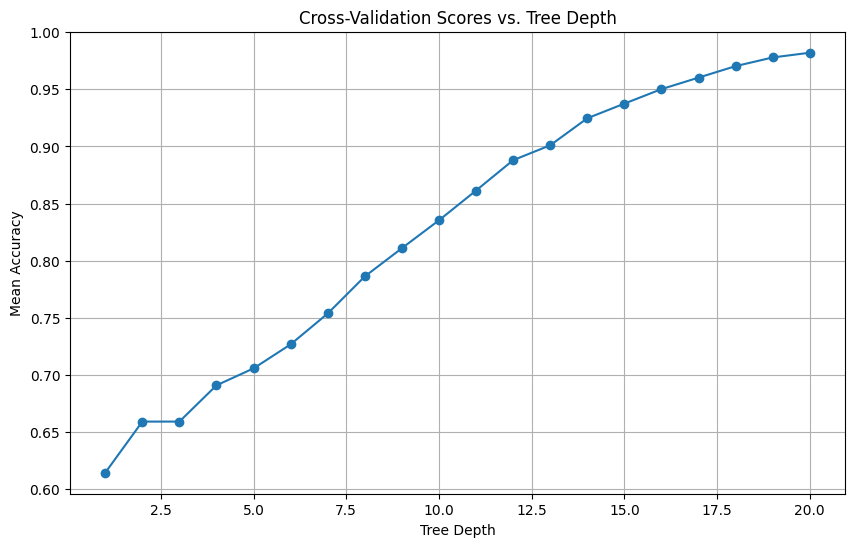

In [110]:
plt.figure(figsize=(10, 6))
plt.plot(depths, cv_scores, marker='o', linestyle='-')
plt.title('Cross-Validation Scores vs. Tree Depth')
plt.xlabel('Tree Depth')
plt.ylabel('Mean Accuracy')
plt.grid(True)
plt.show()

In [111]:
optimal_depth = depths[np.argmax(cv_scores)]
print(f"Optimal Depth: {optimal_depth}")

Optimal Depth: 20


In [112]:
clf = DecisionTreeClassifier(max_depth=optimal_depth, random_state=42)
clf.fit(X_train, y_train)
test_accuracy = clf.score(X_test, y_test)

print(f"Test Accuracy with Optimal Depth: {test_accuracy:.4f}")

Test Accuracy with Optimal Depth: 0.9921


In [113]:
for depth in (depths):
  clf = DecisionTreeClassifier(criterion="entropy", max_depth=depth)
  clf = clf.fit(X_train,y_train)
  y_pred = clf.predict(X_test)
  print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.6192897632544181
Accuracy: 0.6641380460153384
Accuracy: 0.6641380460153384
Accuracy: 0.6974824941647215
Accuracy: 0.7001500500166722
Accuracy: 0.733244414804935
Accuracy: 0.7440813604534845
Accuracy: 0.7725075025008337
Accuracy: 0.7977659219739913
Accuracy: 0.8094364788262755
Accuracy: 0.8226908969656552
Accuracy: 0.8431143714571524
Accuracy: 0.8584528176058687
Accuracy: 0.8735411803934645
Accuracy: 0.8965488496165388
Accuracy: 0.9074691563854618
Accuracy: 0.9187229076358786
Accuracy: 0.9304768256085362
Accuracy: 0.9456485495165055
Accuracy: 0.9523174391463821


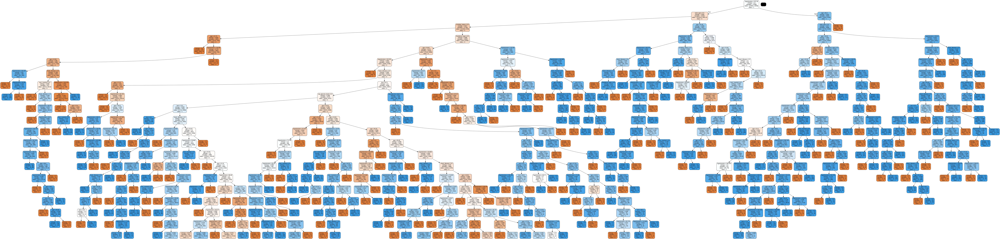

In [114]:
from six import StringIO
from IPython.display import Image
from sklearn.tree import export_graphviz
import pydotplus
dot_data = StringIO()
export_graphviz(clf, out_file=dot_data,
                filled=True, rounded=True,
                special_characters=True, feature_names = feature_cols,class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png('stroke.png')
Image(graph.create_png())

In [115]:
from sklearn.metrics import roc_auc_score, roc_curve, auc

In [116]:
#AUC score
y_pred_prob = clf.predict_proba(X_test)[:, 1]
auc_roc = roc_auc_score(y_test, y_pred_prob)
print(f"AUC-ROC Score: {auc_roc:.4f}")

AUC-ROC Score: 0.9922


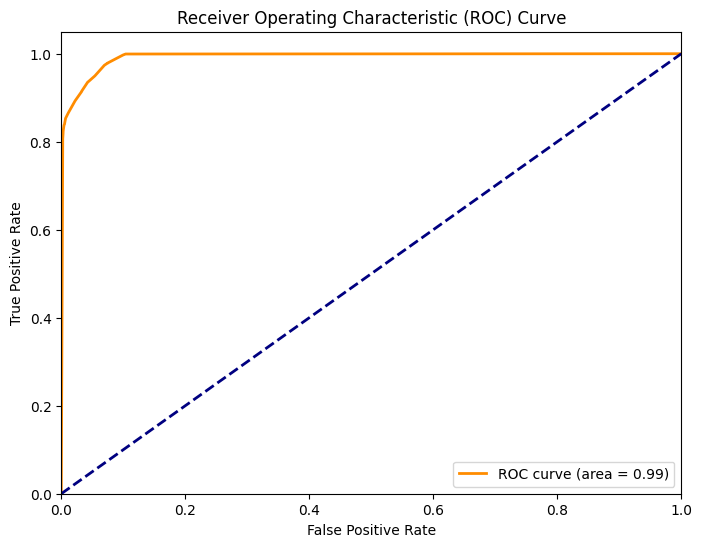

In [117]:
fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

In [118]:
#F1 Score
from sklearn.metrics import f1_score, classification_report
f1 = f1_score(y_test, y_pred)
print(f"F1 Score: {f1:.4f}")

F1 Score: 0.9541


In [119]:
classification_rep = classification_report(y_test, y_pred)
print("Classification Report:\n", classification_rep)

Classification Report:
               precision    recall  f1-score   support

           0       0.98      0.93      0.95      5924
           1       0.93      0.98      0.95      6072

    accuracy                           0.95     11996
   macro avg       0.95      0.95      0.95     11996
weighted avg       0.95      0.95      0.95     11996



In [120]:
precision = precision_score(y_test, y_pred)
print(f"Precision Score: {precision:.4f}")

recall = recall_score(y_test, y_pred)
print(f"Recall Score: {recall:.4f}")

Precision Score: 0.9310
Recall Score: 0.9783


In [121]:
#Confusion matrix for KNN Model
cmDecision = metrics.confusion_matrix(y_test, y_pred)
print(cmDecision)
print(metrics.classification_report(y_test,y_pred))

[[5484  440]
 [ 132 5940]]
              precision    recall  f1-score   support

           0       0.98      0.93      0.95      5924
           1       0.93      0.98      0.95      6072

    accuracy                           0.95     11996
   macro avg       0.95      0.95      0.95     11996
weighted avg       0.95      0.95      0.95     11996



Text(0.5, 23.52222222222222, 'Predicted label')

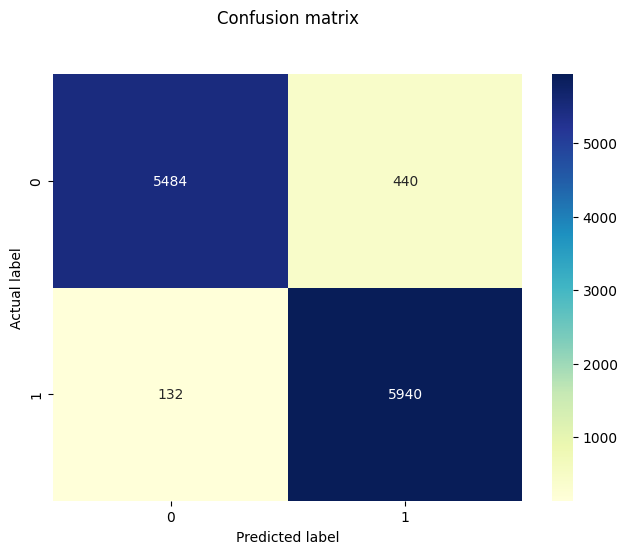

In [122]:
sns.heatmap(pd.DataFrame(cmDecision), annot=True, cmap="YlGnBu" ,fmt='g')
ax.xaxis.set_label_position("top")
plt.tight_layout()
plt.title('Confusion matrix', y=1.1)
plt.ylabel('Actual label')
plt.xlabel('Predicted label')